# Turbine Power DataP: Using the data provided in the csv file the task is to predict power output for the next 15 days.
Several methods are used to try and forecast this power output. Initially I presume SARIMA would be the most logical given the seasonal nature of the data but as you will see, it was not the best by a long shot. I also used XGBoost and RandomForest regressors which proved the best. Lastly and exploration using an LSTM was done although the results for that were disappointing..

In [8]:
#!pip3 install --upgrade tensorflow

# import packages
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import math
from scipy.optimize import curve_fit
import pandas_profiling as pp
import seaborn as sns
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
import pmdarima as pm # for SARIMAX algorith

import xgboost as xgb # for XGBoost algorith
from sklearn.ensemble import RandomForestRegressor # for RandomForest regressor

# for scaling
from sklearn.preprocessing import MinMaxScaler


# LSTM imports
#import tensorflow as tf
#from tf.keras.models import Sequential
#from tf.keras.layers import *
#from tf.keras.callbacks import ModelCheckpoint
#from tf.keras.losses import MeanSquaredError
#from tf.keras.metrics import RootMeanSquaredError
#from tf.keras.optimizers import Adam
#from keras.callbacks import EarlyStopping



In [9]:
# to get the plots to show in the same size
%matplotlib inline
plt.rcParams['figure.figsize'] = (35,16)

In [10]:
# import the data and set the time column as the index

turb_df= pd.read_csv('/Users/pree/Desktop/Turbine_Data.csv',parse_dates=['Unnamed: 0'],index_col=['Unnamed: 0'])
    


# Feature Analysis

In [11]:
turb_df.head()

,ActivePower,AmbientTemperatue,BearingShaftTemperature,Blade1PitchAngle,Blade2PitchAngle,Blade3PitchAngle,ControlBoxTemperature,GearboxBearingTemperature,GearboxOilTemperature,GeneratorRPM,...,GeneratorWinding2Temperature,HubTemperature,MainBoxTemperature,NacellePosition,ReactivePower,RotorRPM,TurbineStatus,WTG,WindDirection,WindSpeed
2017-12-31 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,G01,NaN,NaN
2017-12-31 00:10:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,G01,NaN,NaN
2017-12-31 00:20:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,G01,NaN,NaN
2017-12-31 00:30:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,G01,NaN,NaN
2017-12-31 00:40:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,G01,NaN,NaN


# Raw Feature Visualization

Alert! from version 0.1.43, after importing, you must do '%matplotlib inline' to display charts in Jupyter Notebooks.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not display plots but saves them in AutoViz_Plots folder in local machine.
Updated: chart_format='bokeh' generates and displays charts in your local Jupyter notebook.
      chart_format='server' generates and displays charts in the browser - one tab for each chart.
      chart_format='html' silently saves charts HTML format - they are also interactive!


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
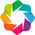

Shape of your Data Set loaded: (118224, 22)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    22 Predictors classified...
        3 variables removed since they were ID or low-information variables
Number of All Scatter Plots = 190
No categorical or numeric vars in data set. Hence no bar charts.
All Plots done
Time to run AutoViz = 20 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [12]:
plt.figure(figsize = (10, 5))
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
df_av = AV.AutoViz('/Users/pree/Desktop/Turbine_Data.csv') 
plt.show() 

%matplotlib inline

In [13]:
turb_df.duplicated().sum()

23039

In [14]:
turb_df.drop_duplicates(inplace=True)

In [15]:
turb_df.shape

(95185, 21)

# Feature Coorelation 

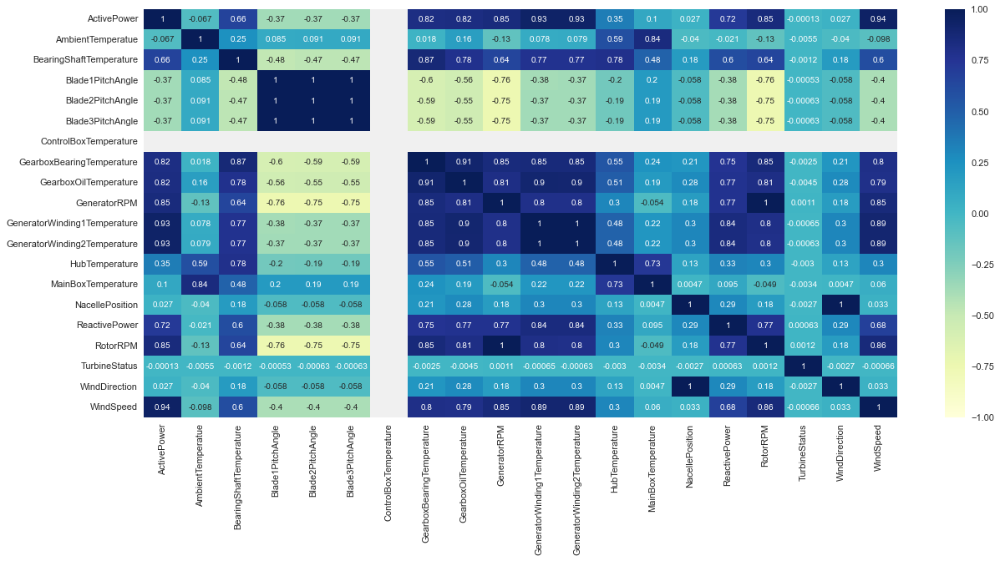

In [16]:
plt.figure(figsize=(18, 9))
sns.heatmap(turb_df.corr(), cmap="YlGnBu", annot=True, vmin= -1, vmax= +1)
plt.show() 

# Generating a Pandas Profile Report

In [17]:
import pandas_profiling as pp 
from pandas_profiling import ProfileReport
pp.ProfileReport(turb_df) 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

PicklingError: Could not pickle the task to send it to the workers.

# Further Feature analysis & Cleaning

In [18]:
turb_df.index = pd.to_datetime(turb_df.index)


In [19]:
turb_df.columns

Index(['ActivePower', 'AmbientTemperatue', 'BearingShaftTemperature',
       'Blade1PitchAngle', 'Blade2PitchAngle', 'Blade3PitchAngle',
       'ControlBoxTemperature', 'GearboxBearingTemperature',
       'GearboxOilTemperature', 'GeneratorRPM', 'GeneratorWinding1Temperature',
       'GeneratorWinding2Temperature', 'HubTemperature', 'MainBoxTemperature',
       'NacellePosition', 'ReactivePower', 'RotorRPM', 'TurbineStatus', 'WTG',
       'WindDirection', 'WindSpeed'],
      dtype='object')

In [20]:
turb_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 95185 entries, 2017-12-31 00:00:00+00:00 to 2020-03-30 23:50:00+00:00
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   ActivePower                   94624 non-null  float64
 1   AmbientTemperatue             93698 non-null  float64
 2   BearingShaftTemperature       62380 non-null  float64
 3   Blade1PitchAngle              41987 non-null  float64
 4   Blade2PitchAngle              41882 non-null  float64
 5   Blade3PitchAngle              41882 non-null  float64
 6   ControlBoxTemperature         62022 non-null  float64
 7   GearboxBearingTemperature     62402 non-null  float64
 8   GearboxOilTemperature         62430 non-null  float64
 9   GeneratorRPM                  62287 non-null  float64
 10  GeneratorWinding1Temperature  62419 non-null  float64
 11  GeneratorWinding2Temperature  62441 non-null  float64
 12  HubTemperatur

In [21]:
turb_df.describe()

,ActivePower,AmbientTemperatue,BearingShaftTemperature,Blade1PitchAngle,Blade2PitchAngle,Blade3PitchAngle,ControlBoxTemperature,GearboxBearingTemperature,GearboxOilTemperature,GeneratorRPM,GeneratorWinding1Temperature,GeneratorWinding2Temperature,HubTemperature,MainBoxTemperature,NacellePosition,ReactivePower,RotorRPM,TurbineStatus,WindDirection,WindSpeed
count,94624.000000,93698.000000,62380.000000,41987.000000,41882.000000,41882.000000,62022.0,62402.000000,62430.000000,62287.000000,62419.000000,62441.000000,62268.000000,62369.000000,72108.000000,94622.000000,62119.000000,6.275900e+04,72108.000000,94469.000000
mean,619.036994,28.777569,43.105338,9.751759,10.038709,10.038709,0.0,64.376222,57.561706,1102.146658,72.462897,71.829134,36.979752,39.635107,196.307894,88.070309,9.908585,2.284016e+03,196.307894,5.879193
std,610.917748,4.358470,5.168850,20.646533,20.272100,20.272100,0.0,10.020754,6.324124,527.967896,22.626685,22.649494,4.884101,5.428555,88.279316,116.498176,4.717546,3.590288e+05,88.279316,2.617241
min,-38.524659,0.000000,0.000000,-43.156734,-26.443415,-26.443415,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-203.182591,0.000000,0.000000e+00,0.000000,0.000000
25%,80.098952,25.625603,39.856871,-0.939896,-0.433316,-0.433316,0.0,57.925129,53.944023,1029.812895,55.492241,54.763998,33.977709,35.843574,145.000000,-0.433723,9.231097,2.000000e+00,145.000000,3.824572
50%,402.880706,28.338961,42.927465,0.395038,0.889782,0.889782,0.0,64.862406,57.197064,1124.930500,65.792061,65.006679,37.003815,39.500759,182.000000,35.938526,10.099272,2.000000e+00,182.000000,5.558520
75%,1073.979105,31.665910,47.018075,8.101939,8.481306,8.481306,0.0,71.104401,61.307270,1515.517020,85.874609,85.342714,40.009538,43.370342,271.000000,147.190453,13.600908,2.000000e+00,271.000000,7.505555
max,1779.032433,42.405597,55.088655,90.143610,90.017830,90.017830,0.0,82.237932,70.764581,1809.941700,126.773031,126.043018,47.996185,54.250000,357.000000,403.713620,16.273495,6.574653e+07,357.000000,22.970893


In [22]:
turb_df.shape

(95185, 21)

# Our data is free of duplicates and now we will check for missing values and how to go about dealing with them

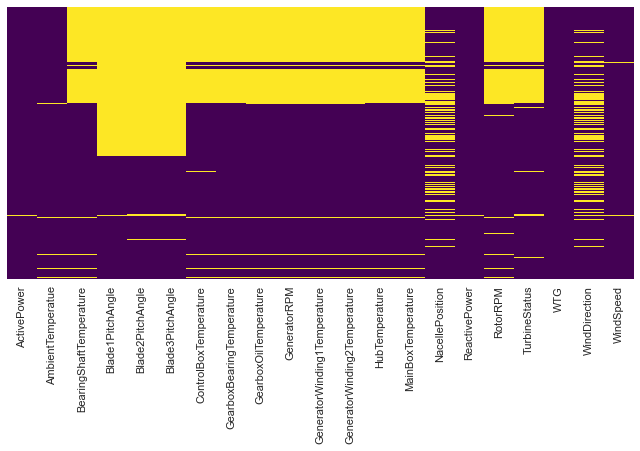

In [24]:
plt.figure(figsize=(10,5))
sns.heatmap(yticklabels=False, data=turb_df.isnull(), cbar=False, cmap="viridis")
plt.show()

In [25]:
turb_df.isna().sum()

ActivePower                       561
AmbientTemperatue                1487
BearingShaftTemperature         32805
Blade1PitchAngle                53198
Blade2PitchAngle                53303
Blade3PitchAngle                53303
ControlBoxTemperature           33163
GearboxBearingTemperature       32783
GearboxOilTemperature           32755
GeneratorRPM                    32898
GeneratorWinding1Temperature    32766
GeneratorWinding2Temperature    32744
HubTemperature                  32917
MainBoxTemperature              32816
NacellePosition                 23077
ReactivePower                     563
RotorRPM                        33066
TurbineStatus                   32426
WTG                                 0
WindDirection                   23077
WindSpeed                         716
dtype: int64

As we see, the 'ActivePower' & 'Windspeed' have not too many missing values, so we will go ahead and leave them as is!

# Last thing to check for are negative values in both- ActivePower & Windspeed, as it is safe to presume that neither can be true, due to its very nature. We will then drop these from our dataset or rather not consider them in our engineering

In [30]:
# check entries with negative values for ActivePower  - for comparison can also use df['ActivePower']==0 to see wind speeds when no power generated

In [31]:
cols= ['ActivePower', 'WindSpeed']
turb_df[cols][turb_df['ActivePower']<0]

,ActivePower,WindSpeed
2018-01-01 00:00:00+00:00,-5.357727,2.279088
2018-01-01 00:10:00+00:00,-5.822360,2.339343
2018-01-01 00:20:00+00:00,-5.279409,2.455610
2018-01-01 00:30:00+00:00,-4.648054,2.026754
2018-01-01 00:40:00+00:00,-4.684632,1.831420
...,...,...
2020-03-30 03:50:00+00:00,-7.005695,2.505505
2020-03-30 04:00:00+00:00,-5.576951,2.174616
2020-03-30 04:10:00+00:00,-4.945515,2.333189
2020-03-30 04:20:00+00:00,-6.565684,2.946595


# Our data is now clean for feature engineering

Text(0, 0.5, 'Active Power and Wind speed')

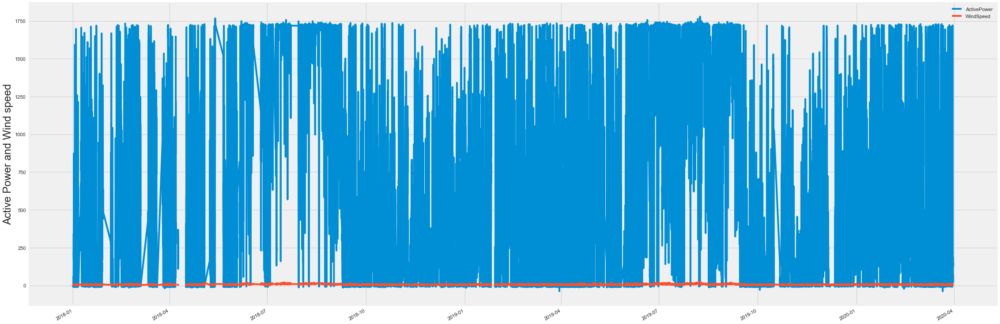

In [32]:
#let's plot with raw data of 'ActivePower' & 'WindSpeed'

import matplotlib.pyplot as plt

%matplotlib inline
plt.rcParams['figure.figsize'] = (35,14)
turb_df['ActivePower'].plot(legend=True)
turb_df['WindSpeed'].plot(legend=True)
plt.ylabel('Active Power and Wind speed', fontsize=24)

# Graph power production
First using all the data (but as there is a reading every 10 minutes it is very messy), then resampling the mean daily values to view more clearly.
A pattern emerges from the daily mean data, there are power output maxima in July, August and September.

Text(0, 0.5, 'Power Generated')

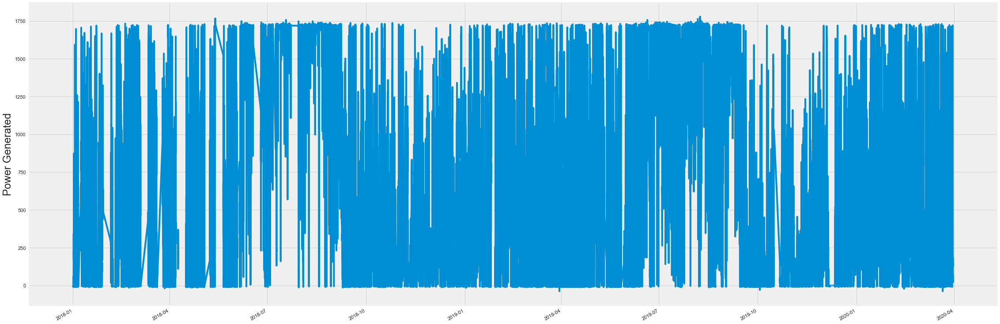

In [33]:
#Power output
turb_df['ActivePower'].plot()
plt.ylabel('Power Generated', fontsize=24)

Text(0, 0.5, 'Mean Daily Power Generated')

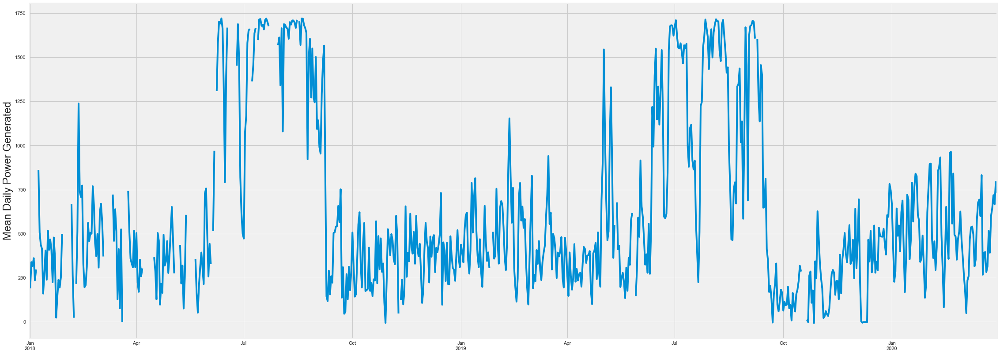

In [34]:
# Let's resample ActivePower on a daily basis as opposed to every 10 minutes
turb_df['ActivePower'].resample('D').mean().plot()
plt.ylabel('Mean Daily Power Generated', fontsize=24)

# We will now plot the WindSpeed and this should clearly show the correlation with Activepower. As the power generated in some months are more than others we should be able to see that the Windspeed is indeed higher during these months

Text(0, 0.5, 'WindSpeed')

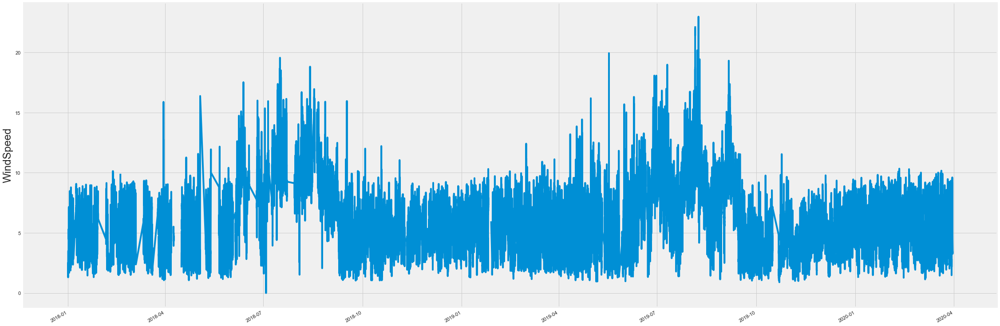

In [35]:
#Windspeed
turb_df['WindSpeed'].plot()
plt.ylabel('WindSpeed', fontsize=24)

Text(0, 0.5, 'Mean Daily WindSpeed')

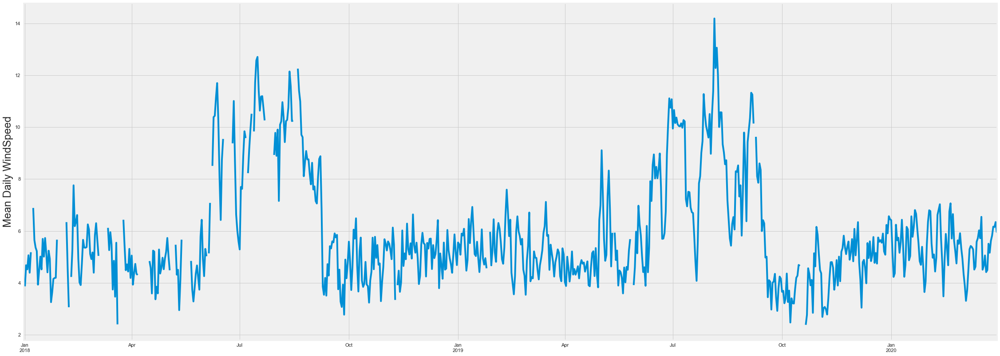

In [36]:
# Let's resample WindSpeed on a daily basis as opposed to every 10 minutes
turb_df['WindSpeed'].resample('D').mean().plot()
plt.ylabel('Mean Daily WindSpeed', fontsize=24)

Text(0, 0.5, 'Mean Daily WindSpeed & ActivePower')

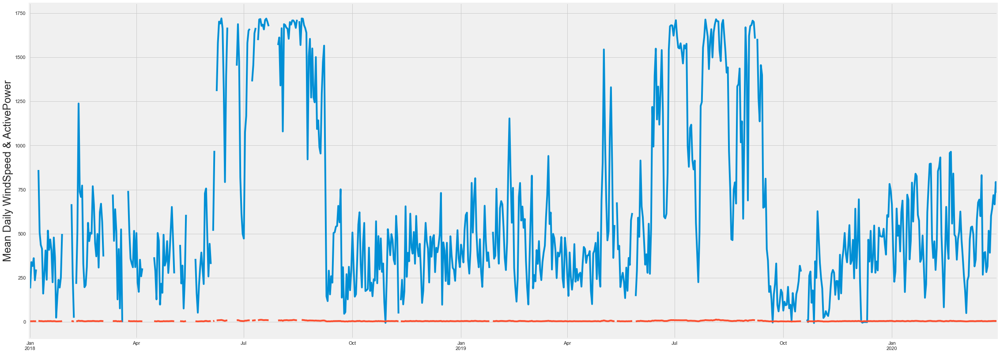

In [37]:
turb_df['ActivePower'].resample('D').mean().plot()
turb_df['WindSpeed'].resample('D').mean().plot()
plt.ylabel('Mean Daily WindSpeed & ActivePower', fontsize=24)

# <u>Finding seasonal pattern</u>: If we were to overlay the two graphs, it would show us the evident correlation. But for that we need to standardize the two features to match. In order to do that, we will multiply the Windspeed by 100 to match the scale of the Power generated

Text(0, 0.5, 'Daily average Active Power and Wind speed*100')

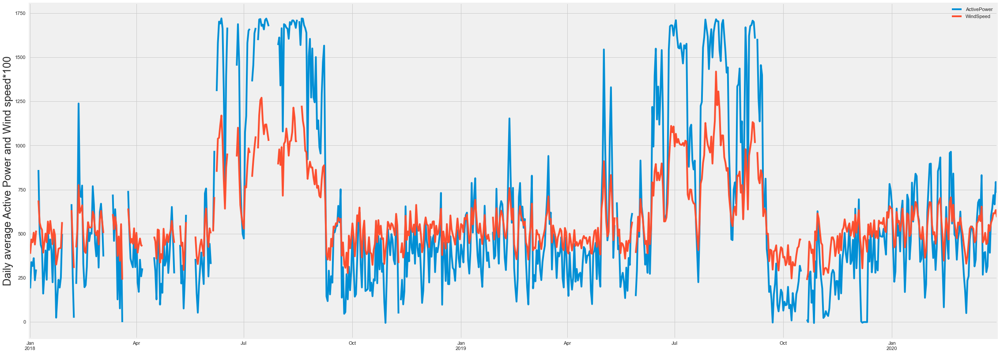

In [38]:
# Graphs merged into one
turb_df['ActivePower'].resample('D').mean().plot(legend=True)
(turb_df['WindSpeed']*100).resample('D').mean().plot(legend=True)
plt.ylabel('Daily average Active Power and Wind speed*100', fontsize=24)

Text(0, 0.5, 'Monthly average Active Power and Wind speed*100')

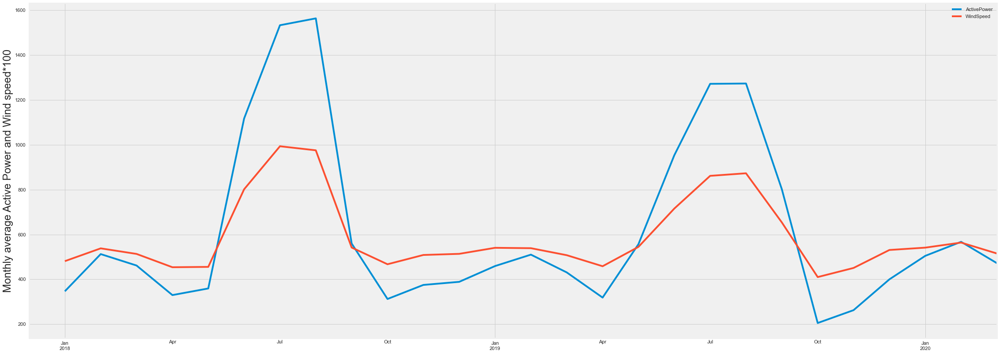

In [39]:
# Graphs merged based on Months
turb_df['ActivePower'].resample('M').mean().plot(legend=True)
(turb_df['WindSpeed']*100).resample('M').mean().plot(legend=True)
plt.ylabel('Monthly average Active Power and Wind speed*100', fontsize=24)

# Let's now check the correlation of ActivePower with other features

In [40]:
#StackOvreflow
turb_df.corr()['ActivePower'].sort_values(ascending=False) 

ActivePower                     1.000000
WindSpeed                       0.940428
GeneratorWinding2Temperature    0.932563
GeneratorWinding1Temperature    0.931433
GeneratorRPM                    0.849621
RotorRPM                        0.849087
GearboxOilTemperature           0.821916
GearboxBearingTemperature       0.820027
ReactivePower                   0.718388
BearingShaftTemperature         0.656992
HubTemperature                  0.347747
MainBoxTemperature              0.101298
NacellePosition                 0.026914
WindDirection                   0.026914
TurbineStatus                  -0.000131
AmbientTemperatue              -0.066685
Blade2PitchAngle               -0.368129
Blade3PitchAngle               -0.368129
Blade1PitchAngle               -0.369142
ControlBoxTemperature                NaN
Name: ActivePower, dtype: float64

# Drop the columns that are not correlated to the ActivePower column and also some columns that are correlated to each other, which again leaves us with just WindSpeed

In [41]:
turb_df= turb_df[['ActivePower', 'WindSpeed']]

In [42]:
turb_df.isna().sum()

ActivePower    561
WindSpeed      716
dtype: int64

In [43]:
#Let's drop the missing values 
turb_df= turb_df.dropna()

In [44]:
turb_df.head()

,ActivePower,WindSpeed
2018-01-01 00:00:00+00:00,-5.357727,2.279088
2018-01-01 00:10:00+00:00,-5.822360,2.339343
2018-01-01 00:20:00+00:00,-5.279409,2.455610
2018-01-01 00:30:00+00:00,-4.648054,2.026754
2018-01-01 00:40:00+00:00,-4.684632,1.831420


# <u> Finding Trend</u>: Look for a pattern of power generation versus wind speed (with the pairplot we created earlier for ActivePower & WindSpeed

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Text(0.5, 1.0, 'Power output versus wind speed')

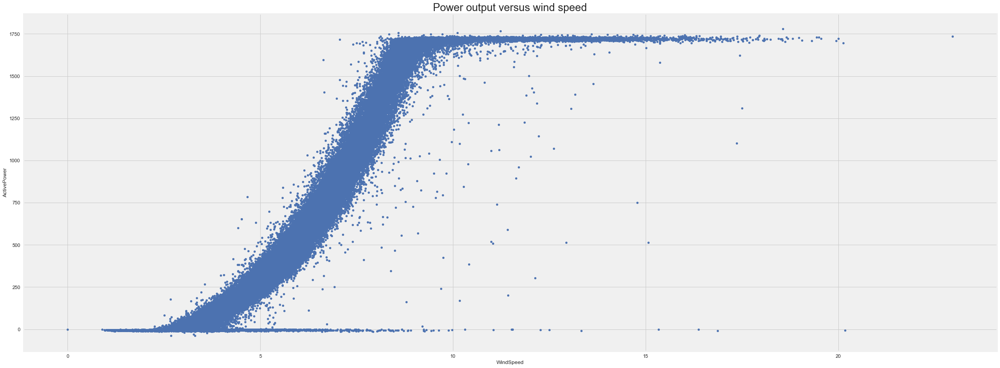

In [45]:
#For better visualization let's recreate just the one pair's plot
turb_df.plot.scatter(y='ActivePower', x='WindSpeed', c=None)
plt.title('Power output versus wind speed', fontsize=24)

# Here we can see that the wind speed needs to be about 2.5m/s to turn the turbine and start generating power. And the maximum wind power is generated at about 8m/s - wind speeds larger than that do not generate any more power (this must be a function of the turbine).¶
There is some noise in the graph but a fairly simple function can be used to describe the data. It is almost linear but a Sigmoid function (exponential) will capture the minimum and maximum features better

(Wikipedia, 2018) ⇒ https://en.wikipedia.org/wiki/logistic_function Retrieved:2018-2-4.
A logistic function or logistic curve is a common "S" shape (sigmoid curve), with equation: : f(x)=L1+e−k(x−x0) where
e = the natural logarithm base (also known as Euler's number),
x0 = the x-value of the sigmoid's midpoint,
L = the curve's maximum value, and
k = the steepness of the curve. For values of x in the domain of real numbers from −∞ to +∞, the S-curve shown on the right is obtained (with the graph of f approaching L as x approaches +∞ and approaching zero as x approaches −∞). The function was named in 1844–1845 by Pierre François Verhulst, who studied it in relation to population growth. The initial stage of growth is approximately exponential; then, as saturation begins, the growth slows, and at maturity, growth stops.
The logistic function finds applications in a range of fields, including artificial neural networks, biology (especially ecology), biomathematics, chemistry, demography, economics, geoscience, mathematical psychology, probability, sociology, political science, linguistics, and statistics.

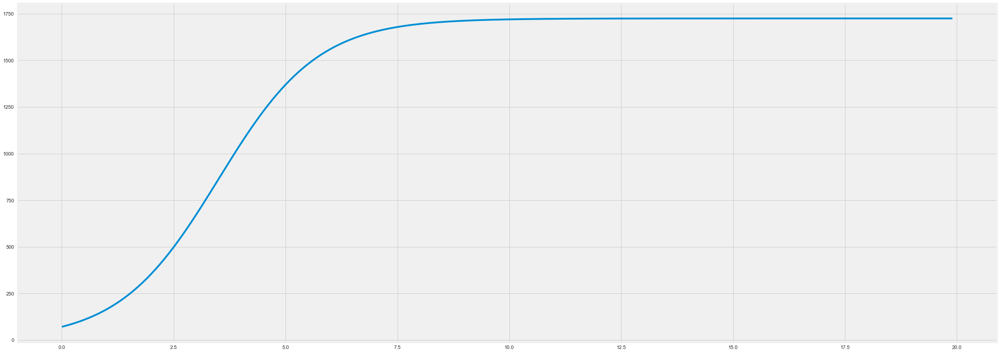

In [46]:
# The graph has the same shape as the one above.

X = np.arange(0, 20, 0.1)

#f(x)=L/1+e−k(x−x0)

Y = 1725 / (1.0 + np.exp(0.9*(-X+3.5)))
plt.plot(X,Y) 
plt.show()

# Define a function to plot this graph and then use curve_fit from scipy to solve for the optimal parameters and finally graph against the measured values. Transparency of measured values is set very low - hence the outliers look like they have disappeared 

In [47]:
# Define a funcation for the graph to be used for prediction - 
def graph_func(X,c1,c2):
    return 1725 / (1.0 + np.exp(c1*(-X+c2)))

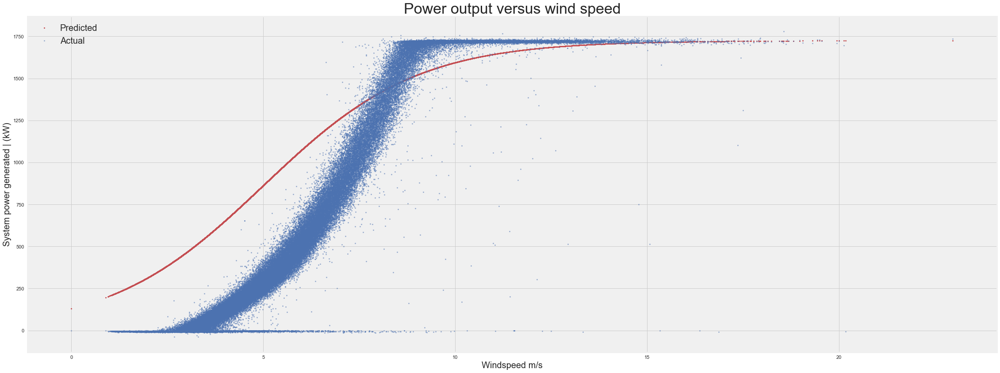

In [48]:
# define and empty array to put the power predictions into
n = len(turb_df['WindSpeed'])
# first guess for the curve parameters - play around with these to get a better shaped curve
c = [0.5, 5]
predicted_power = np.empty(n)
for i in range(n):
    predicted_power[i] = graph_func(turb_df['WindSpeed'][i],c[0],c[1]) # use initial guesses
    
plt.plot(turb_df['WindSpeed'],predicted_power,'r.')
plt.plot(turb_df['WindSpeed'],turb_df['ActivePower'],'b.', alpha=0.5 )
plt.ylabel('System power generated | (kW)', fontsize=20)
plt.xlabel('Windspeed m/s', fontsize=20)
plt.title('Power output versus wind speed', fontsize=34 )
plt.legend(['Predicted','Actual'], fontsize=20)

In [49]:
# now to use curve_fit

c,cov = curve_fit(graph_func,turb_df['WindSpeed'],turb_df['ActivePower'],[0.5,5])
print(c)

[0.99384359 6.87156747]


# Now we do the plot again with the new curve_fit solved values

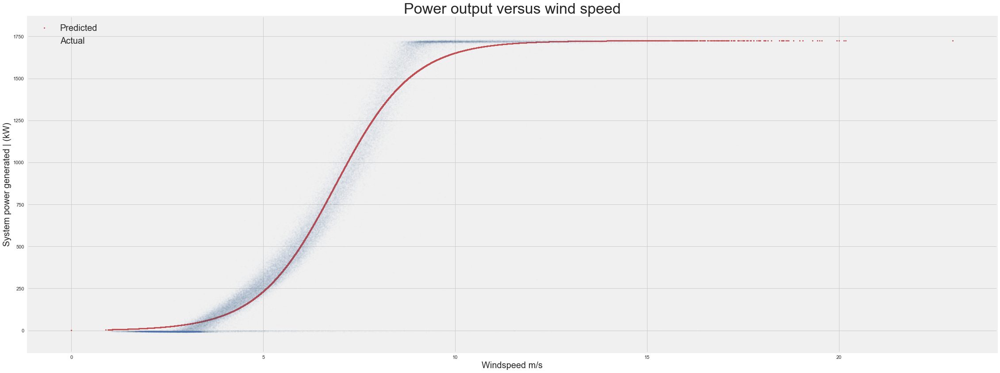

In [50]:
# define and empty array to put the power predictions into
n = len(turb_df['WindSpeed'])

predicted_power = np.empty(n)
for i in range(n):
    predicted_power[i] = graph_func(turb_df['WindSpeed'][i],c[0],c[1]) # use values calculated in the curve_fit equation above
    
plt.plot(turb_df['WindSpeed'],predicted_power,'r.')
plt.plot(turb_df['WindSpeed'],turb_df['ActivePower'],'b.', alpha=0.01 )
plt.ylabel('System power generated | (kW)', fontsize=20)
plt.xlabel('Windspeed m/s', fontsize=20)
plt.title('Power output versus wind speed', fontsize=34 )
plt.legend(['Predicted','Actual'], fontsize=20)

# Calculating Accuracy statistics using sklearn metrics

In [51]:
print('The Coefficient of determination (R-squared) = {:.2f}'.format(r2_score(turb_df['ActivePower'],predicted_power)))
print('The mean absolute error (MAE) for            = {:.2f}'.format(mean_absolute_error(turb_df['ActivePower'],predicted_power)))
print('The RMSE error (RMSE) for                    = {:.2f}'.format(mean_squared_error(turb_df['ActivePower'],predicted_power, squared=False)))

The Coefficient of determination (R-squared) = 0.97
The mean absolute error (MAE) for            = 65.02
The RMSE error (RMSE) for                    = 100.84


# the R squared is excellent for this method - and so with the next 15 days wind speeds we could easily forecast the power output with 97% accuracy.¶

# However, this was not the task here - as stated in the dataset context -
'A long term wind forecasting technique is thus required'. So based on 2 and a bit years worth of data the wind for the next 15 days should be forecast - and hence the wind power that can be generated.
As this is time series analysis with an obvious seasonal component - shown in the monthly graphs below (max in June, July and August for power generation and wind) - some time series techniques need to be employed.

Text(0.5, 1.0, 'Monthly boxplots of Power Generated')

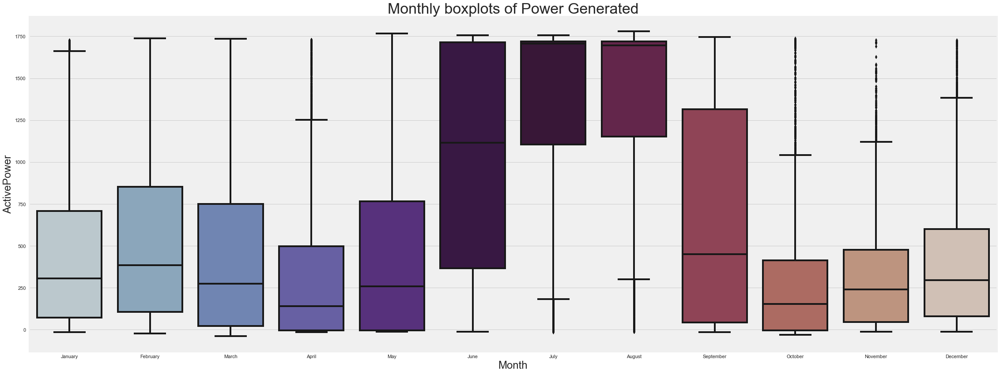

In [52]:
# Now to visualise amount generated by month
sns.boxplot(x=turb_df.index.month_name(), y='ActivePower', data=turb_df, palette="twilight")
plt.ylabel('ActivePower', fontsize=24)
plt.xlabel('Month', fontsize=24)
plt.title("Monthly boxplots of Power Generated", fontsize=34)

Text(0.5, 1.0, 'Monthly boxplots of Wind Speed')

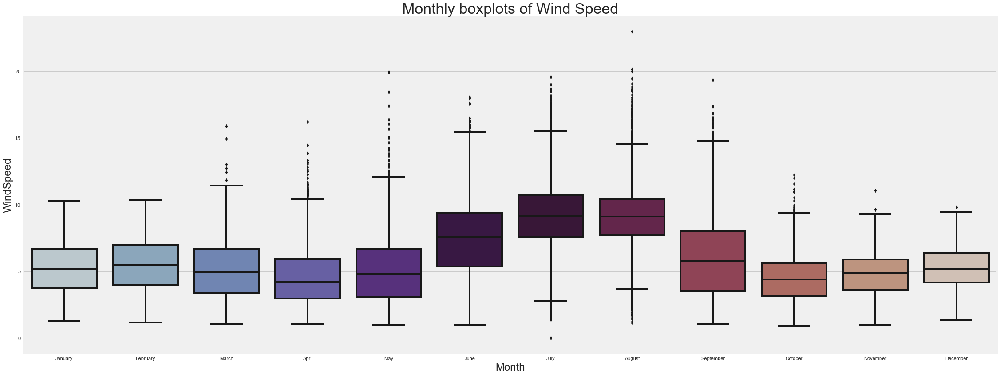

In [53]:
# Now to visualise amount generated by month
sns.boxplot(x=turb_df.index.month_name(), y='WindSpeed', data=turb_df, palette="twilight")
plt.ylabel('WindSpeed', fontsize=24)
plt.xlabel('Month', fontsize=24)
plt.title("Monthly boxplots of Wind Speed", fontsize=34)

# Graph of hourly power generation

Text(0.5, 1.0, 'Hourly boxplots of Wind Speed')

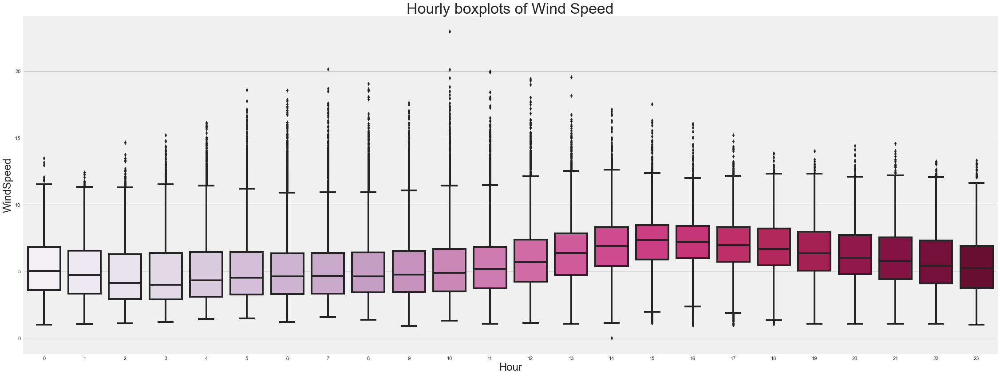

In [54]:
# Now to visualise amount generated by hour
sns.boxplot(x=turb_df.index.hour, y='WindSpeed', data=turb_df, palette="PuRd")
plt.ylabel('WindSpeed', fontsize=24)
plt.xlabel('Hour', fontsize=24)
plt.title("Hourly boxplots of Wind Speed", fontsize=34)

Shows as expected- it is generally windier in the afternoon and hence more power is generated in the afternoon - but it can be generated at any time of course..¶

# Since the graphs above show a seasonal component a simple ARIMA model can't be used but a Seasonal ARIMA or SARIMA can. The other conditions for SARIMA is that it is univariate which is what I have done by only looking at the wind speed for the power output. The SARIMA model uses the same 3 elements of ARIMA, plus the 4th additional seasonal variable.
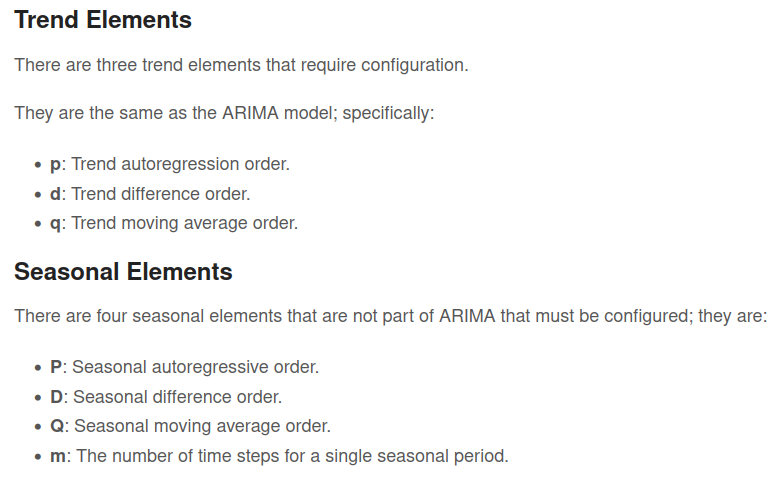

# We will now do a Augmented Dickey-Fuller(ADF) test, so we can test the stationality! 

In [55]:
# Augmented Dickey-Fuller test
dftest = adfuller(turb_df.ActivePower, autolag = 'AIC') 
print(" ADF : ",dftest[0])
print(" p-Value : ", dftest[1])
print(" Num Of Lags : ", dftest[2])
print(" Num Of Observations Used For ADF Regression and Critical Values Calculation :", dftest[3])
print(" Critical Values :")
for key, val in dftest[4].items():
    print("\t",key, ": ", val)

 ADF :  -17.605575583214506
 p-Value :  3.9022283996981964e-30
 Num Of Lags :  66
 Num Of Observations Used For ADF Regression and Critical Values Calculation : 94243
 Critical Values :
	 1% :  -3.430419389536867
	 5% :  -2.861570669067527
	 10% :  -2.5667863240750606


# As seen above we now have a p value of 3.90x10^(-30) which is much smaller than our sample of 0.05 and so even though the data is seasonal it is stationary.


The values of each of the required parameters p,d,q, P,D,Q and m can be worked out using the auto_arima function. However, since it is stationary the d value is 0.
First to resample the data to daily as that is what we are trying to predict - the next 15 days worth of power generated.

In [56]:
# Since we want to simplify resample per day
df_daily  = turb_df[['ActivePower','WindSpeed']].resample('D').mean()
df_daily.dropna(inplace=True) # drop and nas than get introduced

In [57]:
len(df_daily)

750

# Further evidence of the seasonal nature of the data set can be seen using the seasonal decompose function and setting the period = to 31 (a month)

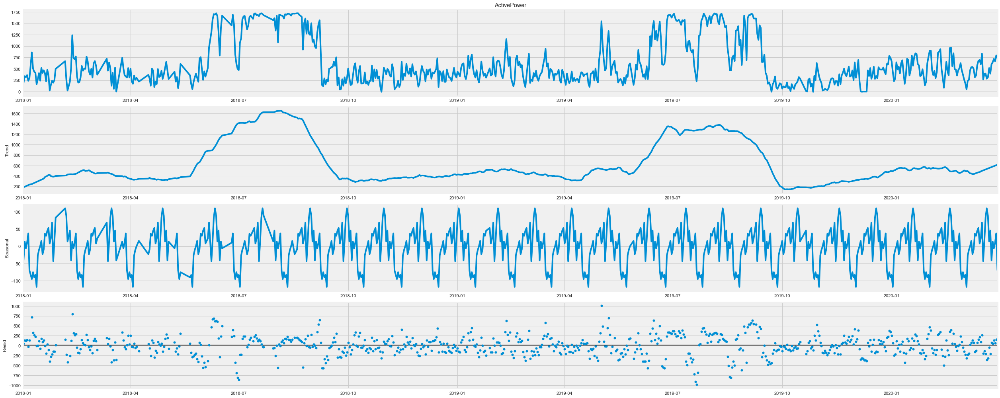

In [58]:
# decompase into seasonal/trend/residual
result = seasonal_decompose(df_daily['ActivePower'].dropna(), period=31, model='additive',extrapolate_trend=True)
result.plot()
plt.show()

In [59]:
model=pm.auto_arima(df_daily['ActivePower'],start_p=0,d=0,start_q=0,
          max_p=15,max_q=5, 
          start_P=0,D=0, start_Q=0, 
          max_P=8, max_Q=8, 
          m=12, seasonal=True, stationary=True,
          error_action='warn',trace=True,
          supress_warnings=True,stepwise=True,
          random_state=20,n_fits=100)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=11403.095, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=10229.591, Time=0.45 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=10723.228, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=12126.733, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=10230.134, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=10224.789, Time=2.67 sec
 ARIMA(1,0,0)(3,0,0)[12] intercept   : AIC=10224.935, Time=7.94 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=10226.787, Time=1.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=10226.872, Time=1.29 sec
 ARIMA(1,0,0)(3,0,1)[12] intercept   : AIC=10226.721, Time=4.69 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=11084.874, Time=3.20 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=10219.817, Time=2.85 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=10222.911, Time=0.47 sec
 ARIMA(2,0,0)(3,0,0)[12] intercept   : AIC=10220.059, Time=6.37 sec
 ARIM

In [60]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  750
Model:             SARIMAX(8, 0, 0)x(3, 0, 0, 12)   Log Likelihood               -5090.421
Date:                            Fri, 23 Sep 2022   AIC                          10206.842
Time:                                    09:54:58   BIC                          10266.903
Sample:                                         0   HQIC                         10229.985
                                            - 750                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     37.6828     16.030      2.351      0.019       6.265      69.101
ar.L1          0.7530      0.031     24.026      0.000       0.692       0.814
ar.L2          0.0217      0.038      0.571      0.568      -0.053       0.096
ar.L3          0.0330      0.043      0.771      0.441      -0.051       0.117
ar.L4         -0.0132      0.044     -0.298      0.766      -0.100       0.074
ar.L5          0.0361      0.042      0.859      0.391      -0.046       0.119
ar.L6          0.0236      0.047      0.502      0.615      -0.069       0.116
ar.L7         -0.0024      0.049     -0.048      0.962      -0.099       0.094
ar.L8          0.0767      0.034      2.259      0.024       0.010       0.143
ar.S.L12       0.0181      0.035      0.524      0.600      -0.050       0.086
ar.S.L24       0.0680      0.040      1.717      0.086      -0.010       0.146
ar.S.L36       0.0537      0.038      1.400      0.161      -0.021       0.129
sigma2      4.621e+04   2048.871     22.553      0.000    4.22e+04    5.02e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                49.52
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               0.86   Skew:                             0.10
Prob(H) (two-sided):                  0.24   Kurtosis:                         4.24
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [61]:
# Set up the SARIMA model with values as above
p = 6
d = 0
q = 0
P = 0
D = 0
Q = 0
m = 12

model = SARIMAX(df_daily['ActivePower'], order=(p,d,q), seasonal_order=(P,D,Q,m)) #- based on model.summary above we don't need the seasonal order part
model_fit = model.fit(disp=0) # disp=0 so no display
    
pred_day = model_fit.predict(start=1, end=len(df_daily['ActivePower']))

In [62]:
# make sure they have the same index (otherwise pred index gets set to 1970-01-01)
pred_day.index = df_daily['ActivePower'].index

In [63]:
df_final = pd.DataFrame(data={'Predictions':pred_day, 'Actuals':df_daily['ActivePower'] })  
df_final.head()

,Predictions,Actuals
2018-01-01 00:00:00+00:00,182.476679,190.815478
2018-01-02 00:00:00+00:00,305.450692,339.470285
2018-01-03 00:00:00+00:00,293.002172,317.517653
2018-01-04 00:00:00+00:00,332.046473,361.856700
2018-01-05 00:00:00+00:00,233.467335,236.783611


In [64]:
print('The Coefficient of determination (R-squared) = {:.2f}'.format(r2_score(df_final['Actuals'],df_final['Predictions'])))
print('The mean absolute error (MAE)                = {:.2f}'.format(mean_absolute_error(df_final['Actuals'],df_final['Predictions'])))
print('The RMSE error (RMSE)                        = {:.2f}'.format(mean_squared_error(df_final['Actuals'],df_final['Predictions'], squared=False)))
print('The Mean absolute percentage error (MAPE)    = {:.2f}'.format(mean_absolute_percentage_error(df_final['Actuals'],df_final['Predictions'])))

The Coefficient of determination (R-squared) = 0.98
The mean absolute error (MAE)                = 47.98
The RMSE error (RMSE)                        = 64.96
The Mean absolute percentage error (MAPE)    = 944692780189602.50


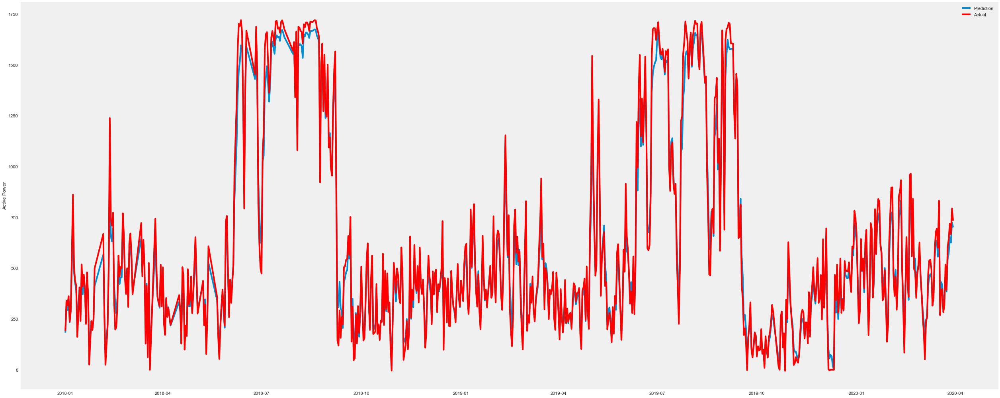

In [65]:
# plot
plt.plot(df_final['Predictions'],label='Prediction')
plt.plot(df_final['Actuals'], color='red',label='Actual')

plt.ylabel('Active Power')
plt.legend()
plt.tight_layout()
plt.grid()
plt.show()

# These results are very good but are based on the whole dataset - that is training the model on the whole dataset and then predicting on the same dataset that has already been used to learn - so of course the results are great - they should be.
The next step is to forecast for the next 15 days. To do this I will set up 3 groups of training and testing data.
1.The whole dataset minus the last 15 days as the test set.
2.80% of the data as train and then 15 days there after as test
3.Two thirds of the data as training and then 15 days after that as test and then compare results.

Work out the number of observations and then work from there - 750  (it's in the model summary too)

In [66]:
# work out the number of observations
len(df_daily['ActivePower'])

750

# First set of Training & Test data

In [67]:
# Out of 750= train is from 0 to 735 and test (last 15 days) is from 735 to 750

train, test = df_daily[0:735], df_daily[735:751]
len(train), len(test)

(735, 15)

In [68]:
train, test

(                           ActivePower  WindSpeed
 2018-01-01 00:00:00+00:00   190.815478   3.866226
 2018-01-02 00:00:00+00:00   339.470285   4.677844
 2018-01-03 00:00:00+00:00   317.517653   4.520639
 2018-01-04 00:00:00+00:00   361.856700   5.063196
 2018-01-05 00:00:00+00:00   236.783611   4.391144
 ...                                ...        ...
 2020-03-11 00:00:00+00:00   315.252383   4.512040
 2020-03-12 00:00:00+00:00   353.652089   4.624096
 2020-03-13 00:00:00+00:00   580.446919   5.584678
 2020-03-14 00:00:00+00:00   677.050456   5.720857
 2020-03-15 00:00:00+00:00   693.703663   6.023467
 
 [735 rows x 2 columns],
                            ActivePower  WindSpeed
 2020-03-16 00:00:00+00:00   599.697524   5.718823
 2020-03-17 00:00:00+00:00   831.902407   6.542955
 2020-03-18 00:00:00+00:00   268.143142   4.508260
 2020-03-19 00:00:00+00:00   391.092910   4.657605
 2020-03-20 00:00:00+00:00   396.575650   5.055901
 2020-03-21 00:00:00+00:00   282.886662   4.413927
 202

In [69]:
# use auto_arima on the training data alone - interestingly different results
model=pm.auto_arima(train['ActivePower'],start_p=0,d=0,start_q=0,
          max_p=15,max_q=5, 
          start_P=0,D=0, start_Q=0, 
          max_P=8, max_Q=8, 
          m=12, seasonal=True, stationary=True,
          error_action='warn',trace=True,
          supress_warnings=True,stepwise=True,
          random_state=20,n_fits=100)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=11187.476, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=10030.456, Time=0.42 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=10517.122, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=11891.165, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=10030.640, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=10026.803, Time=1.21 sec
 ARIMA(1,0,0)(3,0,0)[12] intercept   : AIC=10027.119, Time=6.53 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=10028.725, Time=1.54 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=10028.353, Time=1.36 sec
 ARIMA(1,0,0)(3,0,1)[12] intercept   : AIC=10028.862, Time=4.29 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=10874.510, Time=2.95 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=10022.246, Time=2.81 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=10024.574, Time=0.53 sec
 ARIMA(2,0,0)(3,0,0)[12] intercept   : AIC=10022.630, Time=7.08 sec
 ARIM

In [70]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  735
Model:             SARIMAX(8, 0, 0)x(2, 0, 0, 12)   Log Likelihood               -4992.524
Date:                            Fri, 23 Sep 2022   AIC                          10009.049
Time:                                    09:59:02   BIC                          10064.247
Sample:                                         0   HQIC                         10030.338
                                            - 735                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     37.2516     16.590      2.245      0.025       4.736      69.768
ar.L1          0.7581      0.032     23.943      0.000       0.696       0.820
ar.L2          0.0169      0.039      0.439      0.660      -0.059       0.092
ar.L3          0.0311      0.043      0.730      0.465      -0.052       0.115
ar.L4         -0.0102      0.045     -0.228      0.820      -0.098       0.077
ar.L5          0.0446      0.043      1.043      0.297      -0.039       0.128
ar.L6          0.0159      0.047      0.336      0.737      -0.077       0.108
ar.L7          0.0055      0.049      0.111      0.912      -0.091       0.102
ar.L8          0.0711      0.034      2.097      0.036       0.005       0.137
ar.S.L12       0.0182      0.035      0.526      0.599      -0.050       0.086
ar.S.L24       0.0626      0.040      1.554      0.120      -0.016       0.141
sigma2      4.654e+04   2090.507     22.260      0.000    4.24e+04    5.06e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                47.91
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               0.87   Skew:                             0.13
Prob(H) (two-sided):                  0.27   Kurtosis:                         4.22
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [71]:
# Set up the SARIMA model with values as above
p = 6
d = 0
q = 0
P = 3
D = 0
Q = 0
m = 12

model = SARIMAX(train['ActivePower'], order=(p,d,q), seasonal_order=(P,D,Q,m), dynamic=True)
model_fit = model.fit(disp=0) # disp=0 so no display
    
test_pred = model_fit.predict(start=1, end=len(test['ActivePower']))

In [72]:
# make sure they have the same index (otherwise pred index gets set to 1970-01-01)
test_pred.index = test.index

In [73]:
df_final = pd.DataFrame(data={'Predictions':test_pred, 'Actuals':test['ActivePower'] })  
df_final.head()# use auto_arima on the training data alone - not surpisingly with only a small amount of reduced training data the results are the same

,Predictions,Actuals
2020-03-16 00:00:00+00:00,182.163723,599.697524
2020-03-17 00:00:00+00:00,306.306110,831.902407
2020-03-18 00:00:00+00:00,292.034423,268.143142
2020-03-19 00:00:00+00:00,332.653672,391.092910
2020-03-20 00:00:00+00:00,231.184611,396.575650


In [74]:
print('The Coefficient of determination (R-squared) = {:.2f}'.format(r2_score(df_final['Actuals'],df_final['Predictions'])))
print('The mean absolute error (MAE)                = {:.2f}'.format(mean_absolute_error(df_final['Actuals'],df_final['Predictions'])))
print('The RMSE error (RMSE)                        = {:.2f}'.format(mean_squared_error(turb_df['ActivePower'],predicted_power, squared=False)))
print('The Mean absolute percentage error (MAPE)    = {:.2f}'.format(mean_absolute_percentage_error(df_final['Actuals'],df_final['Predictions'])))  

The Coefficient of determination (R-squared) = -1.89
The mean absolute error (MAE)                = 252.73
The RMSE error (RMSE)                        = 100.84
The Mean absolute percentage error (MAPE)    = 0.43


# First set Train/Test graph A graph of predicted versus actual for last 15 days of the dataset

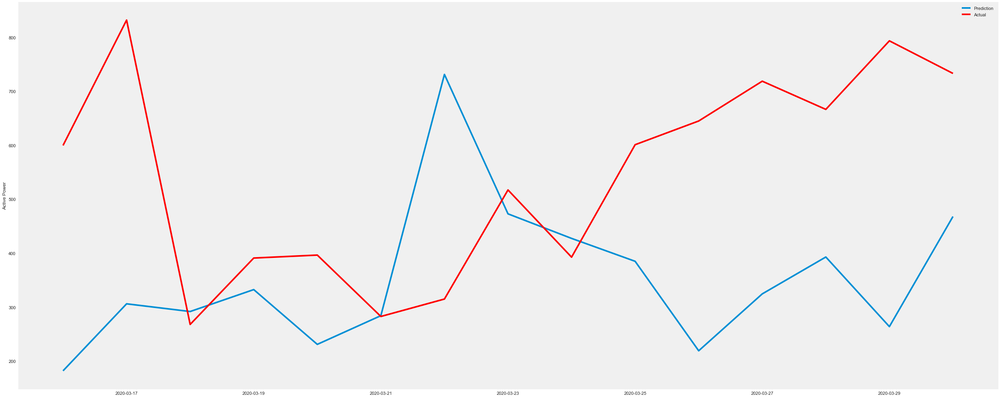

In [75]:
# plot
plt.plot(df_final['Predictions'],label='Prediction')
plt.plot(df_final['Actuals'], color='red',label='Actual')

plt.ylabel('Active Power')
plt.legend()
plt.tight_layout()
plt.grid()
plt.show()

# Second set of Training & Test data

In [76]:
# 80%of 750 
print('80% of 750 is {}' .format (0.8*750))

80% of 750 is 600.0


In [77]:
# train is from 0 to 600, test is from 600 to (600 + 15)= (615)

train, test = df_daily[0:600], df_daily[600:615]

# Repeat the steps exactly as the first set of train test split

In [78]:
model=pm.auto_arima(train['ActivePower'],start_p=0,d=0,start_q=0,
          max_p=15,max_q=5, 
          start_P=0,D=0, start_Q=0, 
          max_P=8, max_Q=8, 
          m=12, seasonal=True, stationary=True,
          error_action='warn',trace=True,
          supress_warnings=True,stepwise=True,
          random_state=20,n_fits=100)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=9207.187, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=8227.752, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=8642.331, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=9785.792, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=8230.554, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=8225.179, Time=2.28 sec
 ARIMA(1,0,0)(3,0,0)[12] intercept   : AIC=8226.317, Time=6.62 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=8227.136, Time=1.95 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=8226.188, Time=1.01 sec
 ARIMA(1,0,0)(3,0,1)[12] intercept   : AIC=8228.190, Time=2.98 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=8954.436, Time=2.89 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=8221.238, Time=2.58 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=8222.882, Time=0.58 sec
 ARIMA(2,0,0)(3,0,0)[12] intercept   : AIC=8222.552, Time=5.43 sec
 ARIMA(2,0,0)(2,0,1

In [79]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  600
Model:             SARIMAX(5, 0, 0)x(2, 0, 0, 12)   Log Likelihood               -4098.662
Date:                            Fri, 23 Sep 2022   AIC                           8215.324
Time:                                    10:00:58   BIC                           8254.897
Sample:                                         0   HQIC                          8230.729
                                            - 600                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     46.1056     19.373      2.380      0.017       8.135      84.076
ar.L1          0.7720      0.036     21.678      0.000       0.702       0.842
ar.L2          0.0318      0.043      0.740      0.459      -0.052       0.116
ar.L3          0.0307      0.048      0.644      0.520      -0.063       0.124
ar.L4         -0.0128      0.051     -0.248      0.804      -0.114       0.088
ar.L5          0.0968      0.037      2.615      0.009       0.024       0.169
ar.S.L12       0.0604      0.040      1.513      0.130      -0.018       0.139
ar.S.L24       0.0604      0.045      1.339      0.180      -0.028       0.149
sigma2      5.075e+04   2495.744     20.335      0.000    4.59e+04    5.56e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                41.57
Prob(Q):                              0.91   Prob(JB):                         0.00
Heteroskedasticity (H):               1.04   Skew:                             0.15
Prob(H) (two-sided):                  0.77   Kurtosis:                         4.25
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [80]:
# Set up the SARIMA model with values as above
p = 6
d = 0
q = 0
P = 0
D = 0
Q = 0
m = 12

model = SARIMAX(train['ActivePower'], order=(p,d,q), seasonal_order=(P,D,Q,m))
model_fit = model.fit(disp=0) # disp=0 so no display
    
test_pred = model_fit.predict(start=1, end=len(test['ActivePower']))

In [81]:
# make sure they have the same index (otherwise pred index gets set to 1970-01-01)
test_pred.index = test.index

In [82]:
df_final = pd.DataFrame(data={'Predictions':test_pred, 'Actuals':test['ActivePower'] })  
df_final.head()

,Predictions,Actuals
2019-11-02 00:00:00+00:00,182.673960,248.205369
2019-11-03 00:00:00+00:00,305.582411,189.996345
2019-11-04 00:00:00+00:00,293.882704,23.167261
2019-11-05 00:00:00+00:00,332.067381,32.695958
2019-11-06 00:00:00+00:00,233.737942,61.686186


In [83]:
print('The Coefficient of determination (R-squared) = {:.2f}'.format(r2_score(df_final['Actuals'],df_final['Predictions'])))
print('The mean absolute error (MAE)                = {:.2f}'.format(mean_absolute_error(df_final['Actuals'],df_final['Predictions'])))
print('The RMSE error (RMSE)                        = {:.2f}'.format(mean_squared_error(df_final['Actuals'],df_final['Predictions'],squared=False)))
print('The Mean absolute percentage error (MAPE)    = {:.2f}'.format(mean_absolute_percentage_error(df_final['Actuals'],df_final['Predictions'])))

The Coefficient of determination (R-squared) = -6.51
The mean absolute error (MAE)                = 214.34
The RMSE error (RMSE)                        = 270.69
The Mean absolute percentage error (MAPE)    = 4.02


# Second set Train/Test graph: A graph using 80% of the dataset for training to predict the 15 days after that.

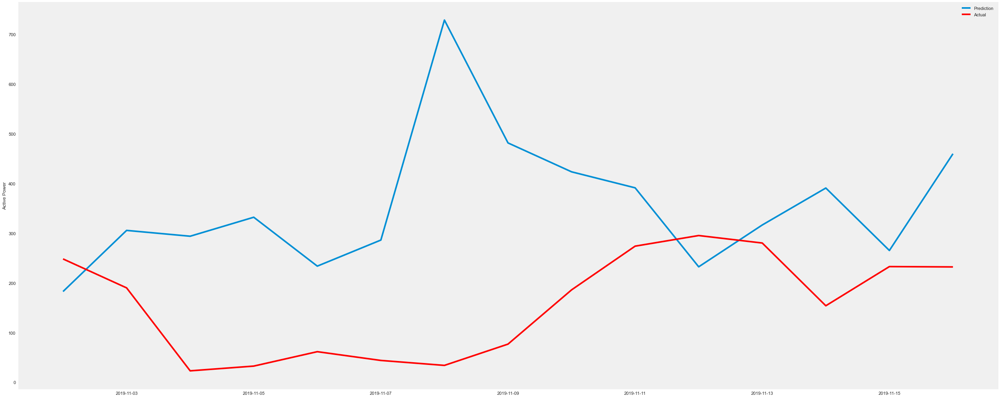

In [84]:
# plot
plt.plot(df_final['Predictions'],label='Prediction')
plt.plot(df_final['Actuals'], color='red',label='Actual')

plt.ylabel('Active Power')
plt.legend()
plt.tight_layout()
plt.grid()
plt.show()

# Results for 2 previous steps (735 days and 600 days) weren't great so there was no need to run 2/3 of the training data for the 3rd set as set-out intially.

# Now we will investigate with some other models to see if a better prediction can be made.
Using XGBoost I will set the input values (x) as WindSpeed values and output (y) as the ActivePower values for training an XGBoost model
Training data (X_train and y_train) is all the data without the last 15 days , then the testing data (X_test and y_test) values become the last 15 days as above.

# Model 1: XGBoost

In [85]:
# train is from 0 to 735 test is from 735 to 750 
X_train, X_test, y_train,y_test = df_daily['WindSpeed'][0:735], df_daily['WindSpeed'][735:750], df_daily['ActivePower'][0:735],  df_daily['ActivePower'][735:750]
len(X_train),len(X_test),len(y_train),len(y_test)

(735, 15, 735, 15)

In [86]:
# define an XGBoost regressor
model = xgb.XGBRegressor(n_estimators=1000)

In [87]:
# Fit the model to the training data 
model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)],
          early_stopping_rounds=50, #stop if 50 consequent rounds without decrease of error
          verbose=False) 

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=1000,
             n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, reg_lambda=1, ...)

In [88]:
# Make the predictions
pred = model.predict(X_test)

In [89]:
df_final = pd.DataFrame(data={'Actuals':y_test, 'Predictions':pred })  

In [90]:
print('The Coefficient of determination (R-squared) = {:.3f}'.format(r2_score(df_final['Actuals'],df_final['Predictions'])))
print('The mean absolute error (MAE)                = {:.2f}'.format(mean_absolute_error(df_final['Actuals'],df_final['Predictions'])))
print('The RMSE error (RMSE)                        = {:.2f}'.format(mean_squared_error(df_final['Actuals'],df_final['Predictions'],squared=False)))
print('The Mean absolute percentage error (MAPE)    = {:.3f}'.format(mean_absolute_percentage_error(df_final['Actuals'],df_final['Predictions'])))   

The Coefficient of determination (R-squared) = 0.898
The mean absolute error (MAE)                = 49.27
The RMSE error (RMSE)                        = 58.82
The Mean absolute percentage error (MAPE)    = 0.095


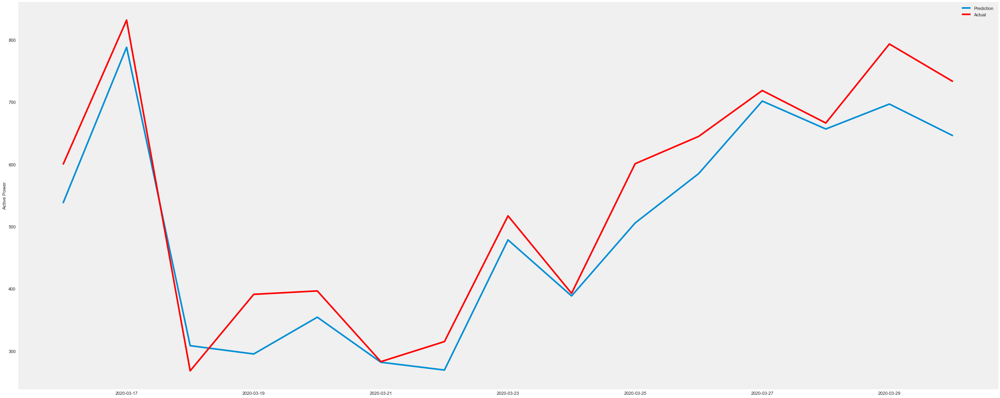

In [91]:
# plot
plt.plot(df_final['Predictions'],label='Prediction')
plt.plot(df_final['Actuals'], color='red',label='Actual')

plt.ylabel('Active Power')
plt.legend()
plt.tight_layout()
plt.grid()
plt.show()

# Model 2: Random Forest

In [92]:
# train is from 0 to 735 test is from 735 to 750 - 

X_train, X_test, y_train,y_test = df_daily[['WindSpeed']][0:735], df_daily[['WindSpeed']][735:750], df_daily[['ActivePower']][0:735],  df_daily[['ActivePower']][735:750]
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((735, 1), (15, 1), (735, 1), (15, 1))

In [93]:
# define the model parameters
model = RandomForestRegressor(n_estimators=1000) #, max_depth=2, max_features = 'sqrt',verbose = 1, bootstrap = False)

In [94]:
# Fit the model to the training data 
model.fit(X_train, y_train) 

RandomForestRegressor(n_estimators=1000)

In [95]:
# Make the predictions
pred = model.predict(X_test)

In [96]:
df_final = pd.DataFrame(data={'Actuals':y_test['ActivePower'], 'Predictions':pred}, index=y_test.index)  

In [97]:
print('The Coefficient of determination (R-squared) = {:.3f}'.format(r2_score(df_final['Actuals'],df_final['Predictions'])))
print('The mean absolute error (MAE)                = {:.2f}'.format(mean_absolute_error(df_final['Actuals'],df_final['Predictions'])))
print('The RMSE error (RMSE)                        = {:.2f}'.format(mean_squared_error(df_final['Actuals'],df_final['Predictions'],squared=False)))
print('The Mean absolute percentage error (MAPE)    = {:.3f}'.format(mean_absolute_percentage_error(df_final['Actuals'],df_final['Predictions'])))   

The Coefficient of determination (R-squared) = 0.866
The mean absolute error (MAE)                = 56.06
The RMSE error (RMSE)                        = 67.33
The Mean absolute percentage error (MAPE)    = 0.108


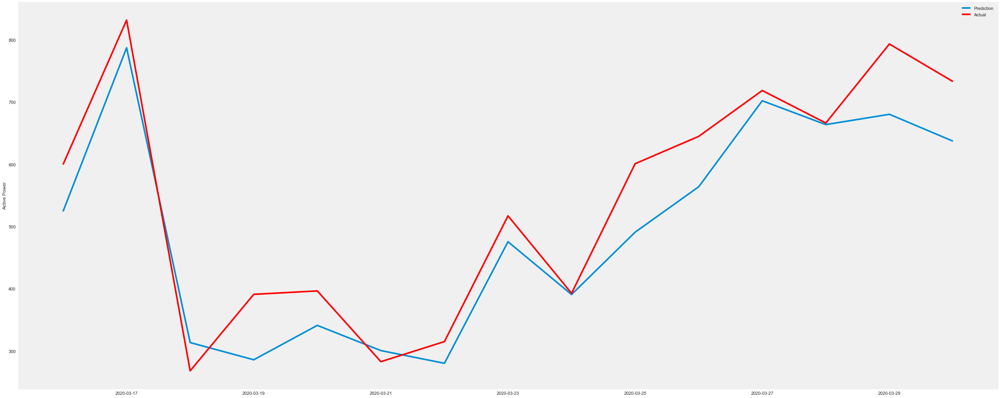

In [98]:
# plot
plt.plot(df_final['Predictions'],label='Prediction')
plt.plot(df_final['Actuals'], color='red',label='Actual')

plt.ylabel('Active Power')
plt.legend()
plt.tight_layout()
plt.grid()
plt.show()

# Model 3: LSTM

An LSTM is the last thing that I will do. Using the same training data as above the first thing to do is to convert it into the right format to feed into the LSTM. In this case the values for X_train and y_train are somewhat different - now we use the values from multiple previous rows to predict the next ActivePower value. In this case I will use 35 rows of previous data as a guide to forecasting the next 15 values (this makes sense given there is a monthly pattern)
So the first 700 values are reserved for training and the last 50 for testing.
After lots of playing around with changing the number of neurons and batch size I simply could not acheive good results using an LSTM

In [99]:
# train is from 0 to 700 test is from 700 to 750
  
train, test = df_daily['ActivePower'][0:700], df_daily['ActivePower'][700:750]
train.shape,test.shape

((700,), (50,))

In [100]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0,1))
#scaler.fit(train)
train = scaler.fit_transform(train.values.reshape(-1,1))
test = scaler.transform(test.values.reshape(-1,1))

In [101]:
# define a function to create X and y  sets from the  training dataset
# still need to reshape input to be 3D [samples, timesteps, features]

def split_X_y(df, n_steps_in, n_steps_out):
    X, y = [],[]
    for i in range(len(df)):
        # find the end of this pattern
        end_index = i + n_steps_in
        out_end_index = end_index + n_steps_out
        # check if we are beyond the sequence
        if out_end_index > len(df):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = df[i:end_index], df[end_index:out_end_index]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

In [102]:
# choose a number of time steps
n_steps_in, n_steps_out = 35, 15
# split into samples
train_X, train_y = split_X_y(train, n_steps_in, n_steps_out)
test_X, test_y   = split_X_y(test, n_steps_in, n_steps_out)
train_X.shape, train_y.shape, test_X.shape, test_y.shape

((651, 35, 1), (651, 15, 1), (1, 35, 1), (1, 15, 1))

In [103]:
# reshape from [samples, timesteps] into [samples, timesteps, features]
n_features = 1
train_X_res = train_X.reshape((train_X.shape[0], train_X.shape[1], n_features))
train_y_res = train_y.reshape((train_y.shape[0], train_y.shape[1], n_features))

test_X_res  = test_X.reshape((test_X.shape[0], test_X.shape[1], n_features))
test_y_res  = test_y.reshape((test_y.shape[0], test_y.shape[1], n_features))
train_X_res.shape, train_y_res.shape, test_X_res.shape, test_y_res.shape

((651, 35, 1), (651, 15, 1), (1, 35, 1), (1, 15, 1))

In [104]:
!pip3 install --upgrade tensorflow

In [106]:
# LSTM imports
import tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.optimizers import Adam
from keras.callbacks import EarlyStopping

In [107]:
# define model
model = Sequential()
# 1st layer 128 neurons, return sequence is true to stack the next layer and dropout set at 20% and BatchNormalization
model.add(LSTM(128, activation='relu', return_sequences=True, input_shape=(n_steps_in, n_features)))
model.add(Dropout(0.2))
model.add(BatchNormalization())

# 2nd layer 64 neurons, return sequence is now false so it returns and dropout set at 20%
model.add(LSTM(64, activation='relu', return_sequences=False))
model.add(Dropout(0.2))
model.add(BatchNormalization())

# final layer is the number of days of forecasts needed
model.add(Dense(n_steps_out)) 


2022-09-23 10:17:41.958610: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


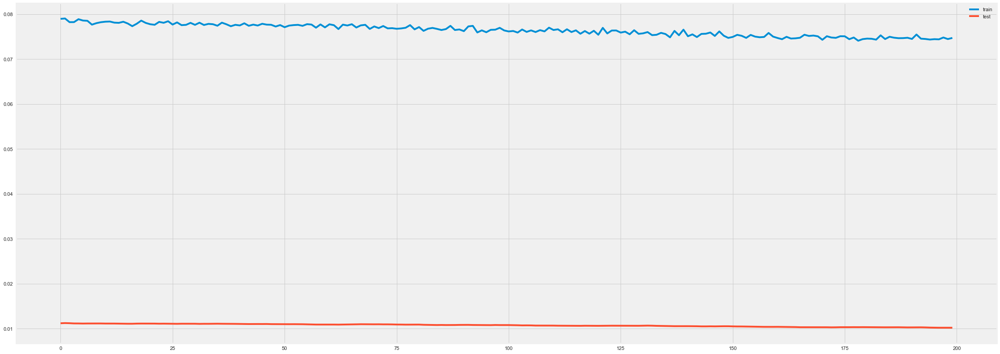

In [111]:
4# Compile and run the model amd plot the loss function, num epochs set at 200 but early stopping means should not reach that
model.compile(loss=MeanSquaredError(), optimizer=Adam(learning_rate=0.0001), metrics=[RootMeanSquaredError()]) 
#  early stopping
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)
# fit network 
history = model.fit(train_X_res, train_y_res, epochs=200,verbose=0, batch_size=64, validation_data=(test_X_res,  test_y_res), shuffle=False, callbacks=[es]) 
# plot history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [112]:
# demonstrate prediction
prediction = model.predict(test_X_res, verbose=0)
#print(scaler.inverse_transform(prediction))
pred = scaler.inverse_transform(prediction)

In [113]:
pred[0][0:15]

array([532.0173 , 534.8428 , 542.1857 , 546.4981 , 548.28546, 549.4973 ,
       557.3568 , 571.6587 , 578.2191 , 590.10345, 587.83246, 597.9469 ,
       589.23267, 613.06866, 601.22394], dtype=float32)

In [114]:
df_final = pd.DataFrame(data={'Actuals':df_daily['ActivePower'][733:748], 'Predictions':pred[0][0:15]}, index = df_daily[733:748].index) 

In [115]:
df_final

,Actuals,Predictions
2020-03-14 00:00:00+00:00,677.050456,532.017273
2020-03-15 00:00:00+00:00,693.703663,534.842773
2020-03-16 00:00:00+00:00,599.697524,542.185730
2020-03-17 00:00:00+00:00,831.902407,546.498108
2020-03-18 00:00:00+00:00,268.143142,548.285461
2020-03-19 00:00:00+00:00,391.092910,549.497314
2020-03-20 00:00:00+00:00,396.575650,557.356812
2020-03-21 00:00:00+00:00,282.886662,571.658691
2020-03-22 00:00:00+00:00,315.146497,578.219116
2020-03-23 00:00:00+00:00,517.257212,590.103455


In [116]:
print('The Coefficient of determination (R-squared) = {:.2f}'.format(r2_score(df_final['Actuals'],df_final['Predictions'])))
print('The mean absolute error (MAE)                = {:.2f}'.format(mean_absolute_error(df_final['Actuals'],df_final['Predictions'])))
print('The RMSE error (RMSE)                        = {:.2f}'.format(mean_squared_error(df_final['Actuals'],df_final['Predictions'],squared=False)))
print('The Mean absolute percentage error (MAPE)    = {:.2f}'.format(mean_absolute_percentage_error(df_final['Actuals'],df_final['Predictions']))) 

The Coefficient of determination (R-squared) = -0.06
The mean absolute error (MAE)                = 153.04
The RMSE error (RMSE)                        = 177.94
The Mean absolute percentage error (MAPE)    = 0.37


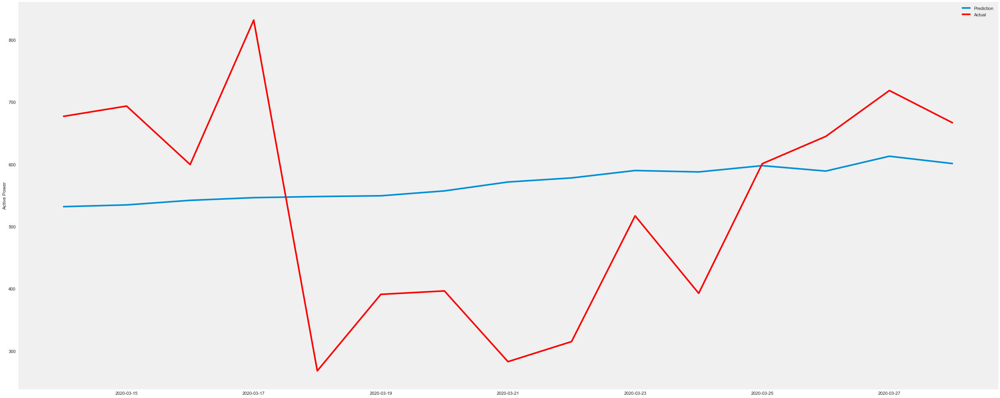

In [117]:
# plot
plt.plot(df_final['Predictions'],label='Prediction')
plt.plot(df_final['Actuals'], color='red',label='Actual')

plt.ylabel('Active Power')
plt.legend()
plt.tight_layout()
plt.grid()
plt.show()

# Results and discussion
Originally when I started this work I thought that a SARIMA model would work best given the state of the data - namely that there was seasonal component to it. However, that proved not to be the case. Also I thought using an LSTM neural network would provide good results but this was also not true. In the end it was the simplest methods that provided the best results - that is both the RandomForest and XGBoost regressors - with RandomForest being slightly better (the R squared better but MAPE slightly worse but I had to go to 3 figures to differentiate).
Overall the general statement that can be made is that either of XGBoost or Randomforest regressor could predict the next 15 days of power output to roughly 94% accurracy (or a mean average percentage error of 6%) and that roughly 91% of the variance in the data (R squared) is explained by either method. And both of these methods achieved a result much faster.

# Note without a random_state set for each method the results generated in the submitted notebook will differ from the figures given here.¶
